<a href="https://colab.research.google.com/github/teja-vardhan-kumar/AI-Chatbot/blob/main/Model_Plottings.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive

drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
! pip install shap interpret

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 572.4/572.4 KB 12.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.1/9.1 MB 87.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 758.0/758.0 KB 55.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 KB 32.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.2/10.2 MB 96.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.4/6.4 MB 89.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.6/3.6 MB 95.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 110.5/110.5 KB 14.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 246.1/246.1 KB 29.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 58.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 132.9/132.9 KB

In [ ]:
import shap
import pickle
import pandas as pd
import numpy as np
import seaborn as sns
import xgboost as xgb
import lightgbm as lgb
import matplotlib.pyplot as plt

from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split
from sklearn.base import BaseEstimator, TransformerMixin
from interpret.blackbox import PartialDependence
from interpret import show, set_visualize_provider
from interpret.provider import InlineProvider

set_visualize_provider(InlineProvider())

In [ ]:
import warnings
warnings.filterwarnings("ignore")

In [ ]:
data = pd.read_excel("Water Pollutant Dataset.xlsx", header = 1)
data.rename(columns = {'Engineered Materials':'Carbon Materials'}, inplace = True)
data.dropna(how='any',inplace=True)
data.head()

,Carbon Materials,Dye Type,pH,Eq.Time (min),Adsorbent Dose (g/L),Dye Concentration (mg/L),T (oC),Removal efficiency (%),Adsorption capacity (mg/g)
0,Graphene,Basic,10.0,300.0,2.70,5.0,298.0,92.0,5.32
1,Reduced Graphene Oxide,Basic,9.0,10.0,0.08,15.0,298.0,95.0,238.60
2,Reduced Graphene Oxide,Basic,6.0,20.0,0.08,50.0,298.0,95.0,1200.00
3,Activated carbon,Basic,10.0,120.0,0.50,20.0,298.0,96.0,169.49
4,Activated carbon,Reactive,5.5,120.0,0.50,20.0,303.0,90.0,129.87


In [ ]:
cat_columns = data.select_dtypes(include=["object"]).columns.tolist()

for feature in cat_columns:
    data[feature] = pd.Series(data[feature], dtype="category")
    

In [ ]:
da = data.drop(['Removal efficiency (%)'], axis = 1)

xa=da.drop(['Adsorption capacity (mg/g)'],axis=1)
ya=da['Adsorption capacity (mg/g)']

In [ ]:
class Pre_process(BaseEstimator, TransformerMixin):
    def transform(self, x):

        cat_columns = x.select_dtypes(include=["object"]).columns.tolist()
        
        for feature in cat_columns:
            x[feature] = pd.Series(x[feature], dtype="category")

        return xgb.DMatrix(x, enable_categorical = True)



In [ ]:
xa_train, xa_test, ya_train, ya_test = train_test_split(
    xa,
    ya,
    test_size=0.2,
    random_state=10
)

xa_d = xgb.DMatrix(xa, enable_categorical = True)
xa_test_d = xgb.DMatrix(xa_test, enable_categorical = True)
xa_train_d = xgb.DMatrix(xa_train, enable_categorical = True)

dmatrix = xgb.DMatrix(data=xa, label=ya, enable_categorical = True)

### Xgboost Model

In [ ]:
xgb_reg = pickle.load(open("xgb_reg.pkl", "rb"))

##### Pearson Correlation Scatter Matrix

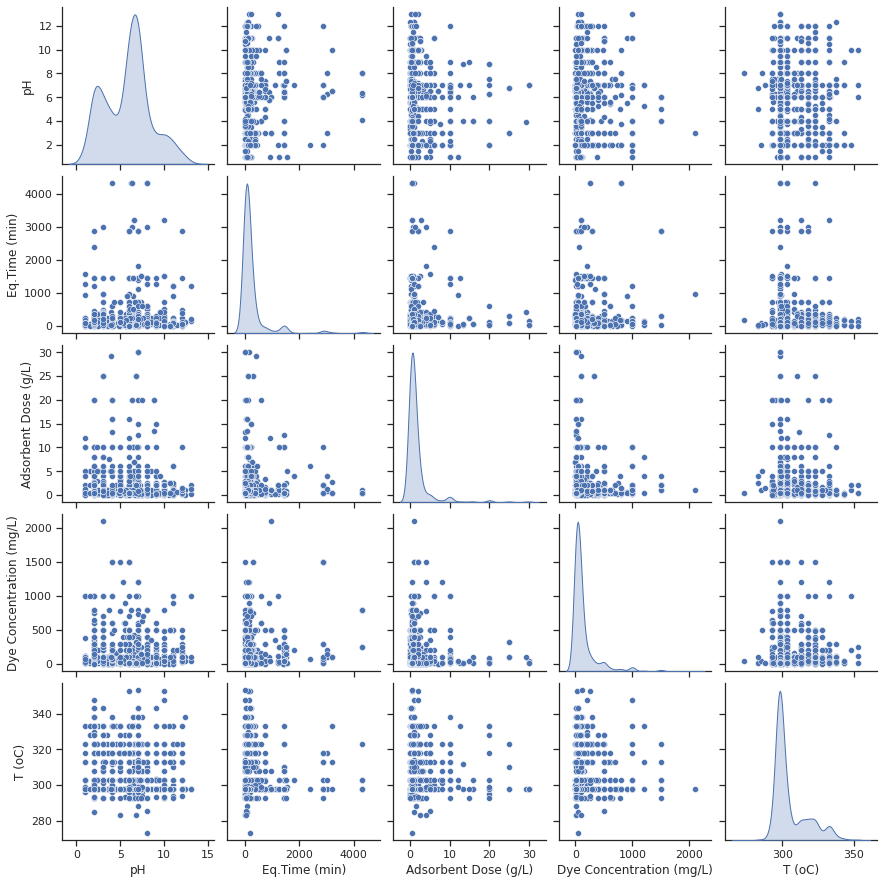

In [ ]:
sns.set(style="ticks", color_codes=True)
sns.pairplot(xa, diag_kind='kde')
plt.show()

##### Scatter Plot for Input Variables

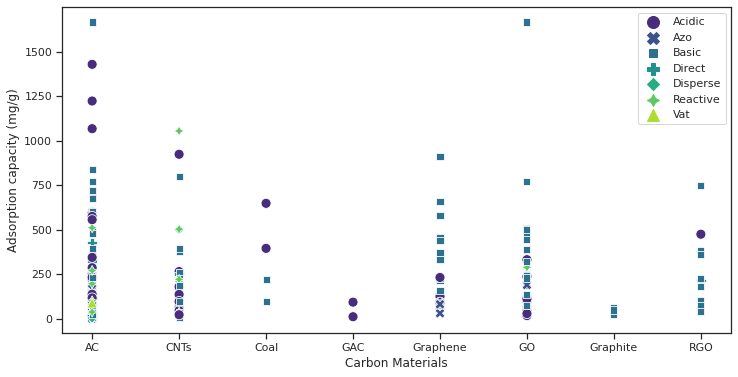

In [ ]:
plt.figure(figsize=(12,6))
sns.scatterplot(x=xa_test['Carbon Materials'], y=ya_test, hue=xa_test['Dye Type'], s=100, palette='viridis', style=xa_test['Dye Type'])
plt.xlabel('Carbon Materials')
plt.ylabel('Adsorption capacity (mg/g)')
plt.xticks(ticks=range(8), labels=['AC', 'CNTs', 'Coal', 'GAC', 'Graphene', 'GO', 'Graphite', 'RGO'])
#plt.yscale('log')
plt.legend(markerscale=2)
plt.show()

##### Partial Dependence Plots

In [ ]:
pipeline = Pipeline([('preprocess', Pre_process()),('xgboost',xgb_reg)])

pdp = PartialDependence(pipeline.predict, xa, num_points=10, std_coef=0.5)
pdp_global = pdp.explain_global()


In [ ]:
show(pdp_global,0)

##### Scatter Plot for Experimental and Predicted Values

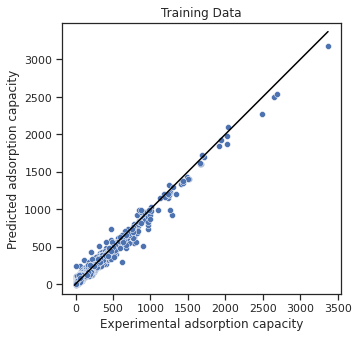

In [ ]:
ya_pred = xgb_reg.predict(xa_train_d)
true_value = ya_train
predicted_value = ya_pred
p1 = max(max(predicted_value), max(true_value))
p2 = min(min(predicted_value), min(true_value))

plt.figure(figsize=(5,5))
sns.scatterplot(x=true_value, y=predicted_value)
plt.plot([p1, p2], [p1, p2], 'black')

plt.xlabel('Experimental adsorption capacity')
plt.ylabel('Predicted adsorption capacity')
plt.title('Training Data')
plt.axis('equal')
plt.show()

<Figure size 360x360 with 0 Axes>

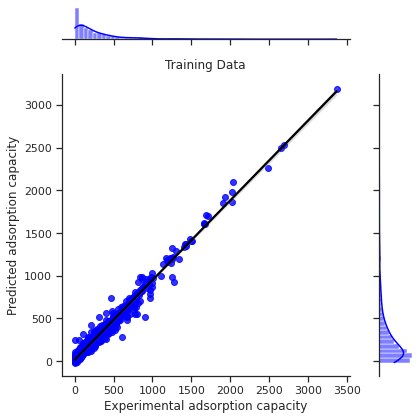

In [ ]:
ya_pred = xgb_reg.predict(xa_train_d)
true_value = ya_train
predicted_value = ya_pred
p1 = max(max(predicted_value), max(true_value))
p2 = min(min(predicted_value), min(true_value))

plt.figure(figsize=(5,5))
sns.jointplot(x=true_value, y=predicted_value, kind='reg', height=6, color='blue',line_kws={'color': 'black'})
#plt.plot([p1, p2], [p1, p2], 'black')

plt.xlabel('Experimental adsorption capacity')
plt.ylabel('Predicted adsorption capacity')
plt.title('Training Data')
plt.tight_layout()
plt.show()


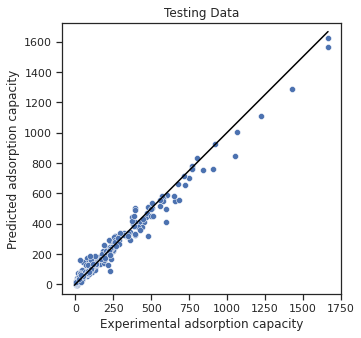

In [ ]:
ya_pred = xgb_reg.predict(xa_test_d)
true_value = ya_test
predicted_value = ya_pred
p1 = max(max(predicted_value), max(true_value))
p2 = min(min(predicted_value), min(true_value))

plt.figure(figsize=(5,5))
sns.scatterplot(x=true_value, y=predicted_value)
plt.plot([p1, p2], [p1, p2],color='black')

plt.xlabel('Experimental adsorption capacity')
plt.ylabel('Predicted adsorption capacity')
plt.title('Testing Data')
plt.axis('equal')
plt.show()

<Figure size 576x576 with 0 Axes>

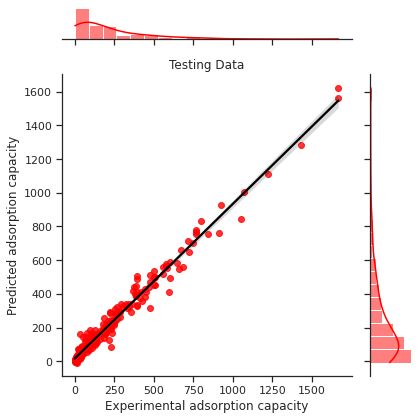

In [ ]:
ya_pred = xgb_reg.predict(xa_test_d)
true_value = ya_test
predicted_value = ya_pred
p1 = max(max(predicted_value), max(true_value))
p2 = min(min(predicted_value), min(true_value))

plt.figure(figsize=(8,8))
sns.jointplot(x=true_value, y=predicted_value, kind='reg', height=6, color='red', line_kws={'color': 'black'})
#plt.plot([p1, p2], [p1, p2],'black')

plt.xlabel('Experimental adsorption capacity')
plt.ylabel('Predicted adsorption capacity')
plt.title('Testing Data')
plt.tight_layout()
plt.show()

##### Feature Importance

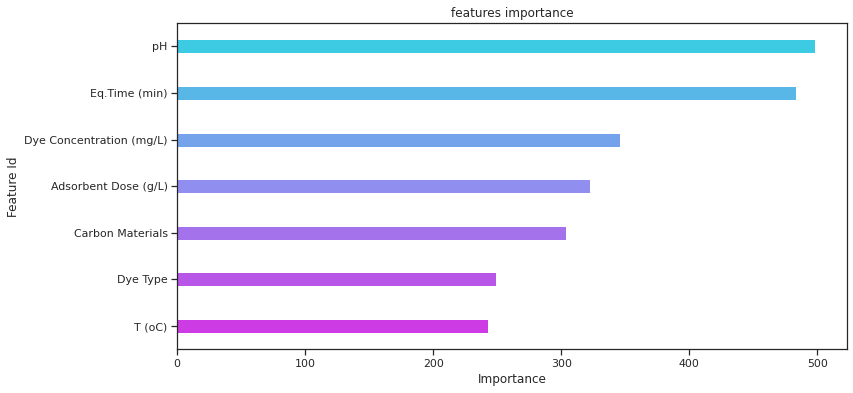

In [ ]:
df_feature_importance = pd.DataFrame({'Importance':xgb_reg.get_fscore().values(),
                                      'Feature Id':xgb_reg.get_fscore().keys()}).sort_values(by="Importance",ascending=False)

plt.figure(figsize=(12, 6));
sns.barplot(x="Importance", y="Feature Id", data=df_feature_importance,palette="cool",width=0.3);
plt.xlabel("Importance")
plt.ylabel("Feature Id")
plt.title('features importance')
plt.show()

###### Shap Plot

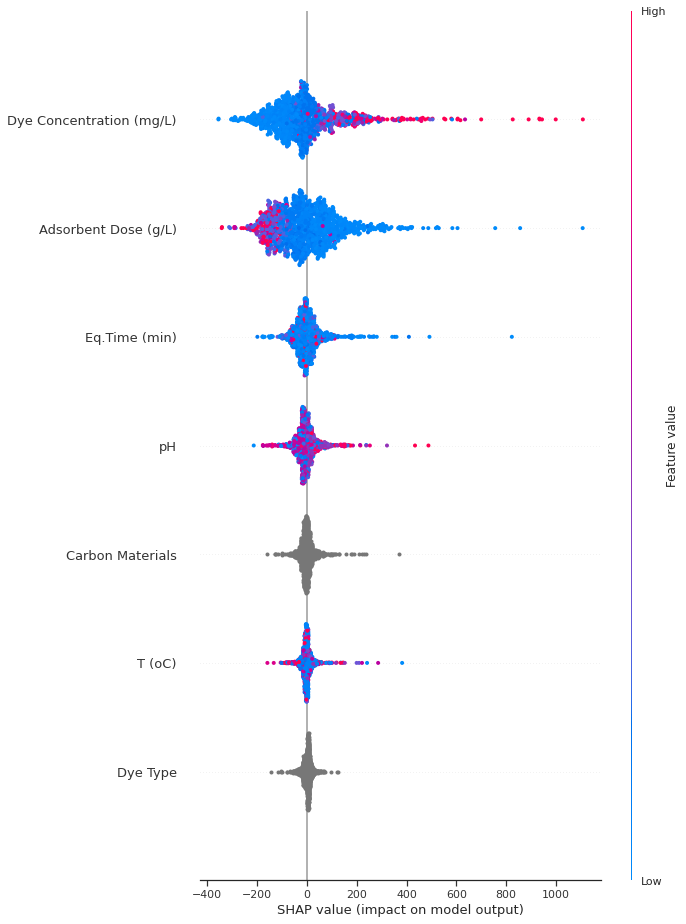

In [ ]:
explainer = shap.TreeExplainer(xgb_reg)
shap_values = explainer.shap_values(dmatrix)
shap.summary_plot(shap_values, xa, plot_size=[10,13], show = False)
plt.gcf().axes[-1].set_aspect(1000)

### LightGbm Model

In [ ]:
lgb_reg = lgb.Booster(model_file='lgb_ad_best_3.txt')

##### Pearson Correlation Scatter Matrix

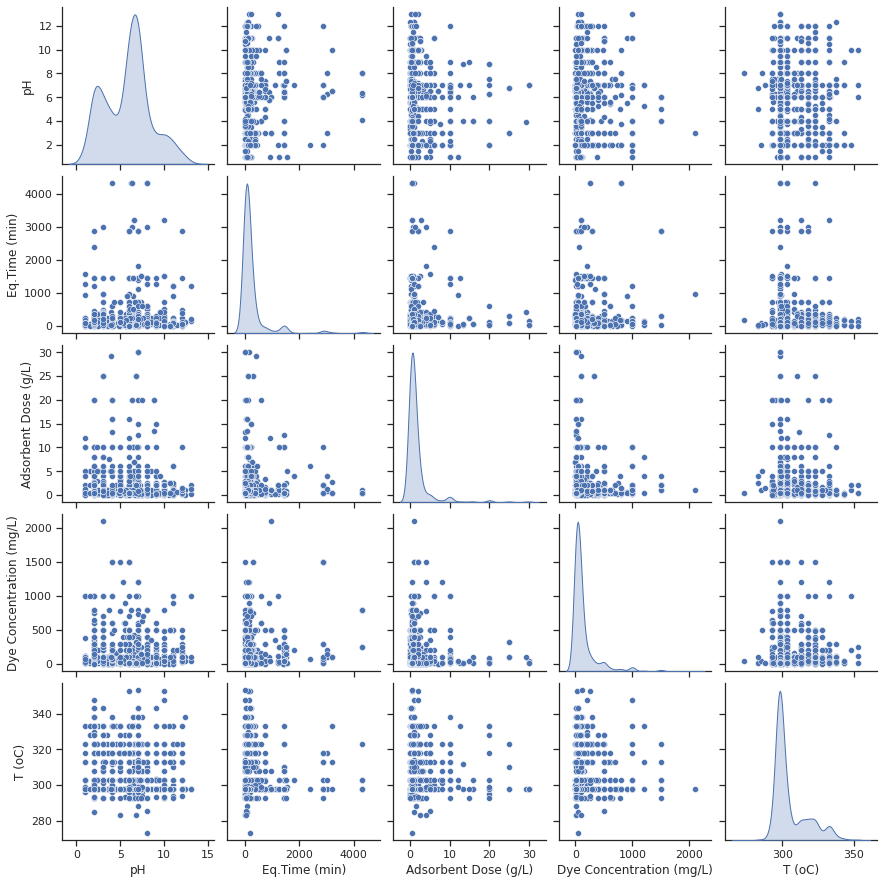

In [ ]:
sns.set(style="ticks", color_codes=True)
sns.pairplot(xa, diag_kind='kde')
plt.show()

##### Scatter Plot for Input Variables

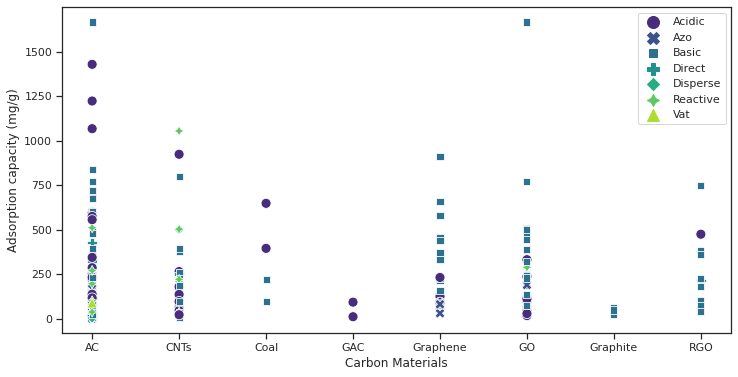

In [ ]:
plt.figure(figsize=(12,6))
sns.scatterplot(x=xa_test['Carbon Materials'], y=ya_test, hue=xa_test['Dye Type'], s=100, palette='viridis', style=xa_test['Dye Type'])
plt.xlabel('Carbon Materials')
plt.ylabel('Adsorption capacity (mg/g)')
#plt.yscale('log')
plt.xticks(ticks=range(8), labels=['AC', 'CNTs', 'Coal', 'GAC', 'Graphene', 'GO', 'Graphite', 'RGO'])
plt.legend(markerscale=2)
plt.show()

##### Scatter Plot for Experimental and Predicted Values

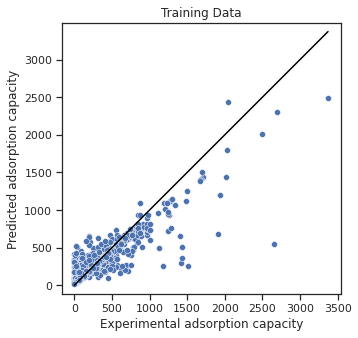

In [ ]:
ya_pred = lgb_reg.predict(xa_train)
true_value = ya_train
predicted_value = ya_pred
p1 = max(max(predicted_value), max(true_value))
p2 = min(min(predicted_value), min(true_value))

plt.figure(figsize=(5,5))
sns.scatterplot(x=true_value, y=predicted_value)
plt.plot([p1, p2], [p1, p2], 'black')

plt.xlabel('Experimental adsorption capacity')
plt.ylabel('Predicted adsorption capacity')
plt.title('Training Data')
plt.axis('equal')
plt.show()

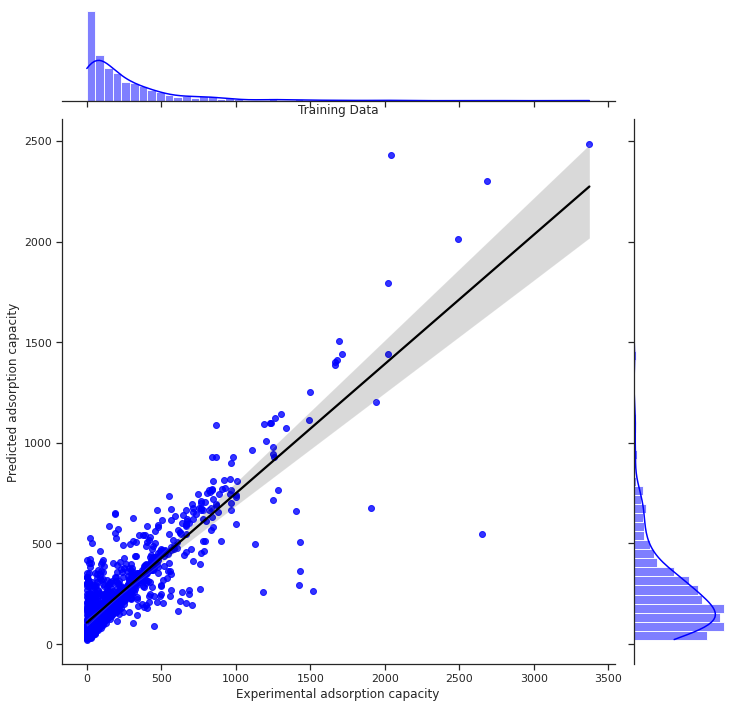

In [ ]:
ya_pred = lgb_reg.predict(xa_train)
true_value = ya_train
predicted_value = ya_pred

sns.jointplot(x=true_value, y=predicted_value, kind='reg', height=10, color='blue',line_kws={'color': 'black'})
plt.xlabel('Experimental adsorption capacity')
plt.ylabel('Predicted adsorption capacity')
plt.title('Training Data')
plt.show()


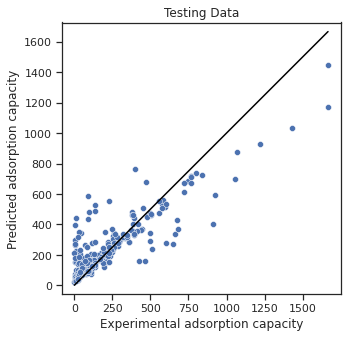

In [ ]:
ya_pred = lgb_reg.predict(xa_test)
true_value = ya_test
predicted_value = ya_pred
p1 = max(max(predicted_value), max(true_value))
p2 = min(min(predicted_value), min(true_value))

plt.figure(figsize=(5,5))
sns.scatterplot(x=true_value, y=predicted_value)
plt.plot([p1, p2], [p1, p2], 'black')

plt.xlabel('Experimental adsorption capacity')
plt.ylabel('Predicted adsorption capacity')
plt.title('Testing Data')
plt.axis('equal')
plt.show()

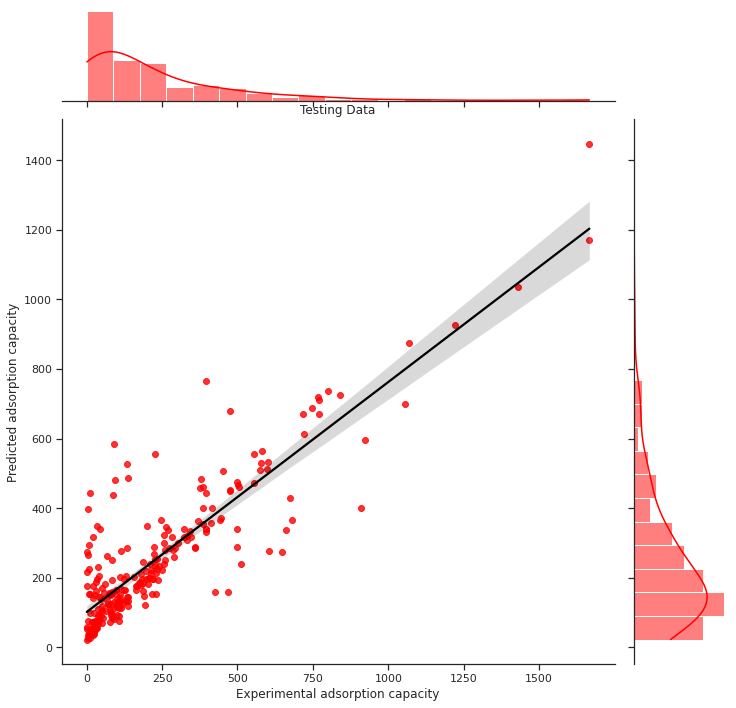

In [ ]:
ya_pred = lgb_reg.predict(xa_test)
true_value = ya_test
predicted_value = ya_pred

sns.jointplot(x=true_value, y=predicted_value, kind='reg', height=10, color='red',line_kws={'color': 'black'})
plt.xlabel('Experimental adsorption capacity')
plt.ylabel('Predicted adsorption capacity')
plt.title('Testing Data')
plt.show()


##### Feature Importance

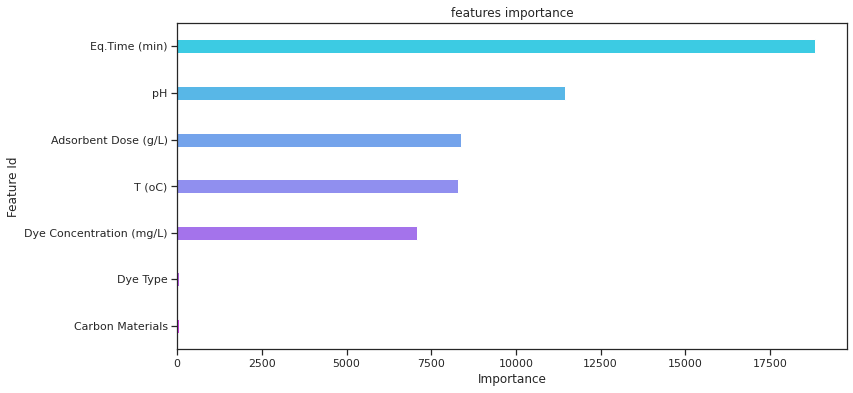

In [ ]:
df_feature_importance = pd.DataFrame({'Importance':lgb_reg.feature_importance(),
                                      'Feature Id':xa.columns.tolist()}).sort_values(by="Importance",ascending=False)

plt.figure(figsize=(12, 6));
sns.barplot(x="Importance", y="Feature Id", data=df_feature_importance,palette="cool",width=0.3);
plt.xlabel("Importance")
plt.ylabel("Feature Id")
plt.title('features importance')
plt.show()

###### Shap Plot

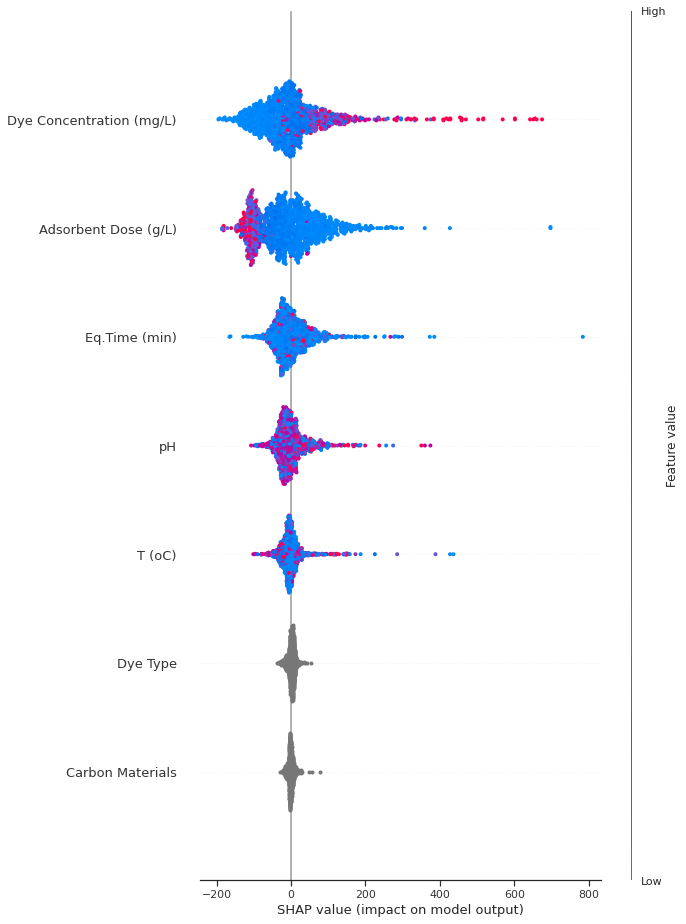

In [ ]:
lgb_reg.params["objective"] = "regression"
explainer = shap.TreeExplainer(lgb_reg)
shap_values = explainer.shap_values(X = xa, y = ya)
shap.summary_plot(shap_values, xa, plot_size=[10,13], show=False)
plt.gcf().axes[-1].set_aspect(1000)

### Random Forest

In [ ]:
rf_reg = pickle.load(open("rf_reg.pkl", "rb"))

##### Pearson Correlation Scatter Matrix

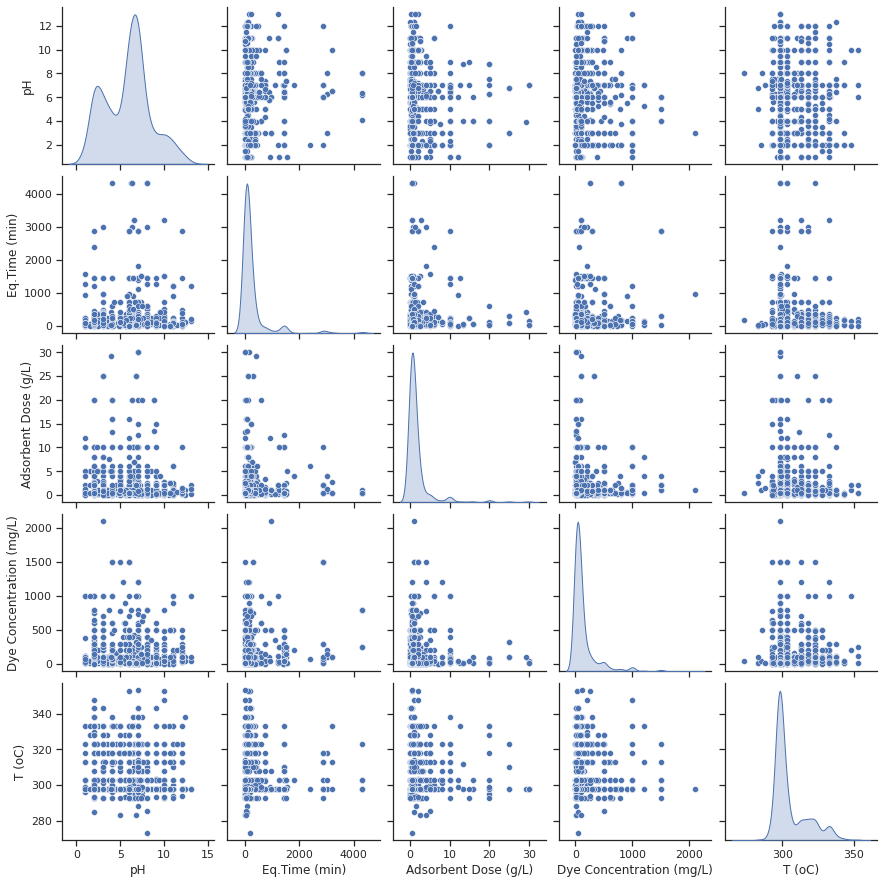

In [ ]:
sns.set(style="ticks", color_codes=True)
sns.pairplot(xa, diag_kind='kde')
plt.show()

##### Scatter Plot for Input Variables

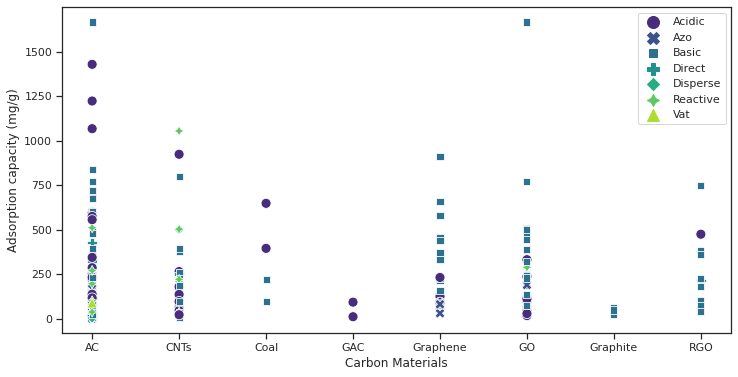

In [ ]:
plt.figure(figsize=(12,6))
sns.scatterplot(x=xa_test['Carbon Materials'], y=ya_test, hue=xa_test['Dye Type'], s=100, palette='viridis', style=xa_test['Dye Type'])
plt.xlabel('Carbon Materials')
plt.ylabel('Adsorption capacity (mg/g)')
#plt.yscale('log')
plt.xticks(ticks=range(8), labels=['AC', 'CNTs', 'Coal', 'GAC', 'Graphene', 'GO', 'Graphite', 'RGO'])
plt.legend(markerscale=2)
plt.show()

##### Partial Dependence Plots

In [ ]:
xa = pd.get_dummies(xa)
xa_train,xa_test,ya_train,ya_test = train_test_split(xa,ya,train_size=0.8,random_state= 42)

In [ ]:
%matplotlib inline
pdp = PartialDependence(rf_reg.predict, xa, num_points=10, std_coef=0.5)
pdp_global = pdp.explain_global()

set_visualize_provider(InlineProvider())
show(pdp_global,0)

##### Scatter Plot for Experimental and Predicted Values

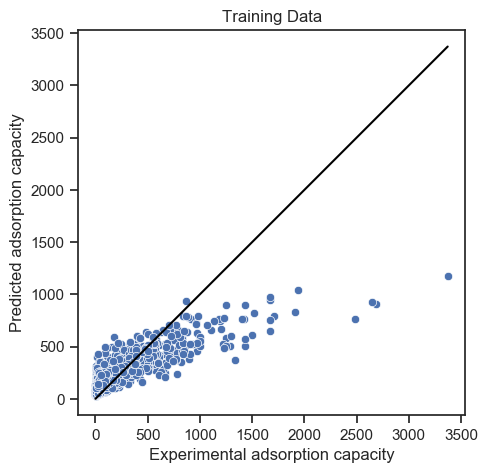

In [ ]:
ya_pred = rf_reg.predict(xa_train)
true_value = ya_train
predicted_value = ya_pred
p1 = max(max(predicted_value), max(true_value))
p2 = min(min(predicted_value), min(true_value))

plt.figure(figsize=(5,5))
sns.scatterplot(x=true_value, y=predicted_value)
plt.plot([p1, p2], [p1, p2], 'black')

plt.xlabel('Experimental adsorption capacity')
plt.ylabel('Predicted adsorption capacity')
plt.title('Training Data')
plt.axis('equal')
plt.show()

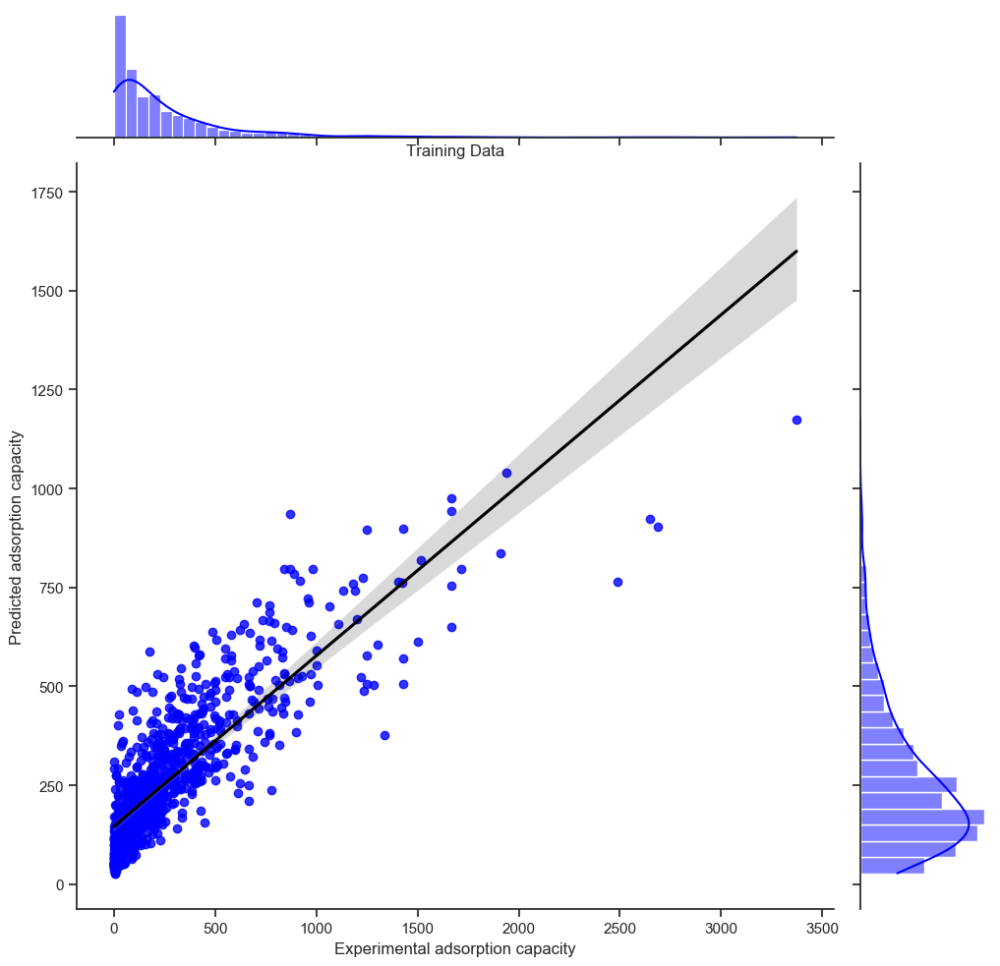

In [ ]:
ya_pred = rf_reg.predict(xa_train)
true_value = ya_train
predicted_value = ya_pred

sns.jointplot(x=true_value, y=predicted_value, kind='reg', height=10, color='blue',line_kws={'color': 'black'})
plt.xlabel('Experimental adsorption capacity')
plt.ylabel('Predicted adsorption capacity')
plt.title('Training Data')
plt.show()


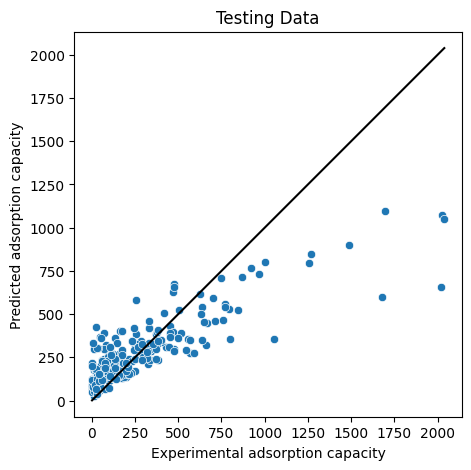

In [ ]:
ya_pred = rf_reg.predict(xa_test)
true_value = ya_test
predicted_value = ya_pred
p1 = max(max(predicted_value), max(true_value))
p2 = min(min(predicted_value), min(true_value))

plt.figure(figsize=(5,5))
sns.scatterplot(x=true_value, y=predicted_value)
plt.plot([p1, p2], [p1, p2], 'black')

plt.xlabel('Experimental adsorption capacity')
plt.ylabel('Predicted adsorption capacity')
plt.title('Testing Data')
plt.axis('equal')
plt.show()

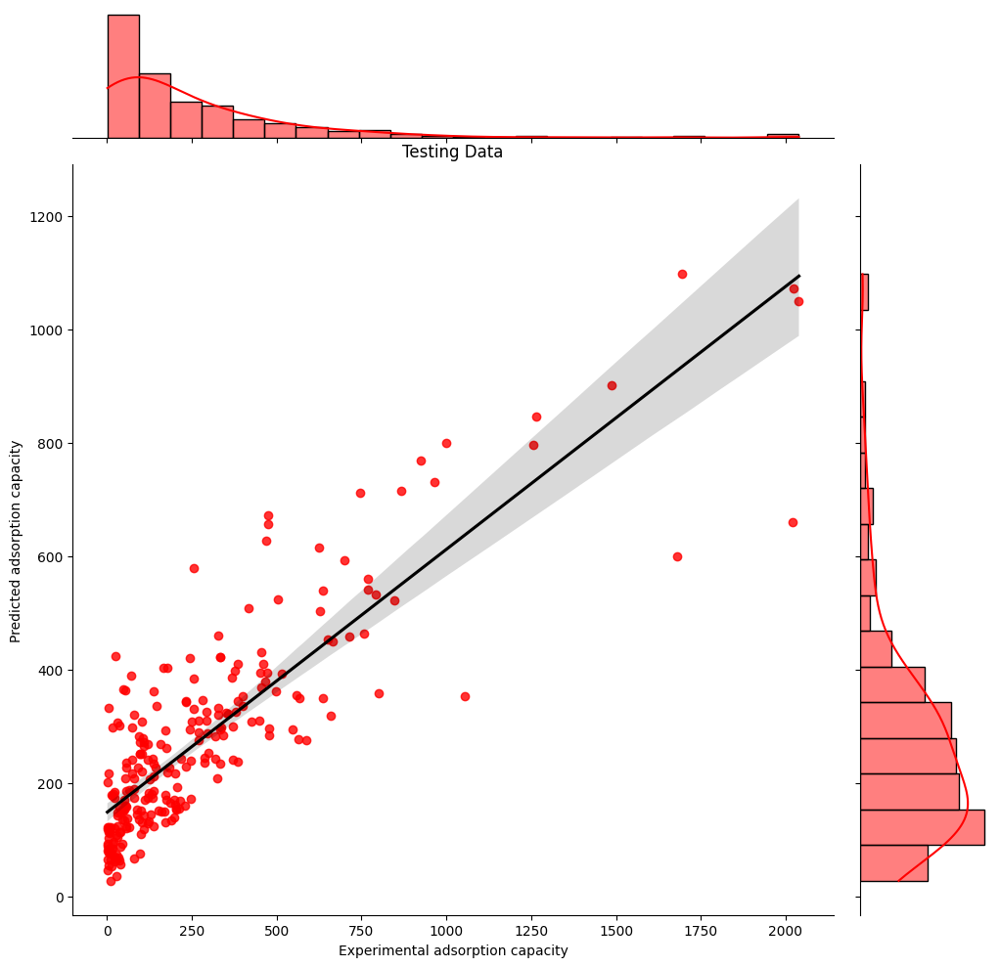

In [ ]:
ya_pred = rf_reg.predict(xa_test)
true_value = ya_test
predicted_value = ya_pred

sns.jointplot(x=true_value, y=predicted_value, kind='reg', height=10, color='red',line_kws={'color': 'black'})
plt.xlabel('Experimental adsorption capacity')
plt.ylabel('Predicted adsorption capacity')
plt.title('Testing Data')
plt.show()


##### Feature Importance

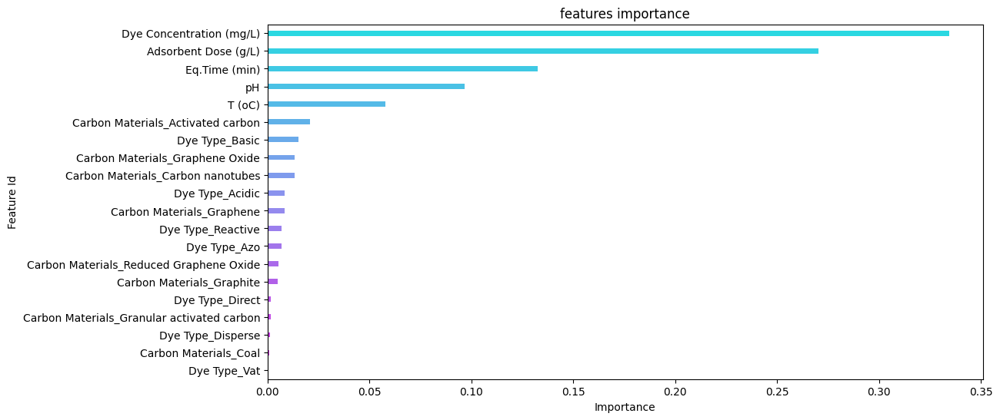

In [ ]:
df_feature_importance = pd.DataFrame({'Importance':rf_reg.feature_importances_,
                                      'Feature Id':xa.columns.tolist()}).sort_values(by="Importance",ascending=False)

plt.figure(figsize=(12, 6));
sns.barplot(x="Importance", y="Feature Id", data=df_feature_importance,palette="cool",width=0.3);
plt.xlabel("Importance")
plt.ylabel("Feature Id")
plt.title('features importance')
plt.show()

###### Shap Plot

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


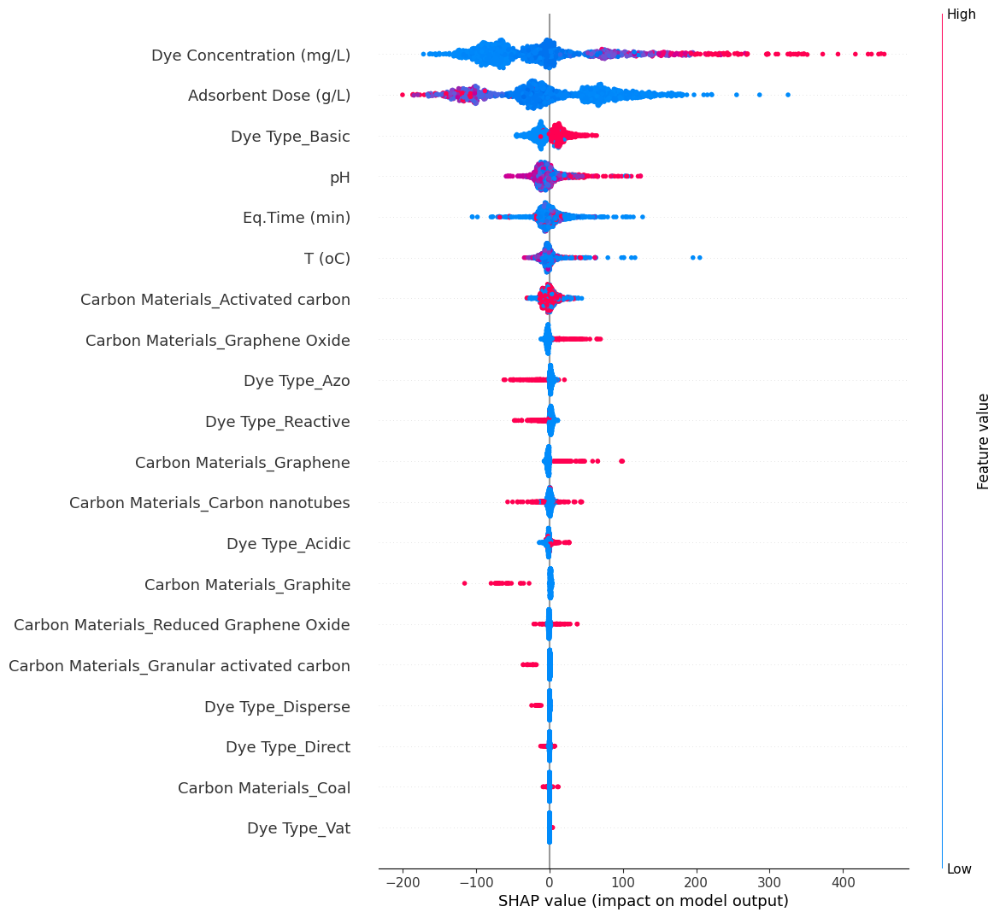

In [ ]:
import shap
#lgb_reg.params["objective"] = "regression"
explainer = shap.TreeExplainer(rf_reg)
shap_values = explainer.shap_values(X = xa, y = ya)
shap.summary_plot(shap_values, xa, plot_size=[10,13], show=False)
plt.gcf().axes[-1].set_aspect(1000)

##### Partial Dependence Plot